In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colabqṭ

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 23 kB/s 
     |████████████████████████████████| 6.6 MB 29.9 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Successfully uninstalled torchvision-0.11.1+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
     |████████████████████████████████| 274 kB 5.3 MB/s 
  Created wheel fo

In [2]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2 MB 694 kB/s 
     |████████████████████████████████| 50 kB 4.0 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220305-py3-none-any.whl size=61214 sha256=0492140359b963eb2bd51c76e959e1c7ab491559b9b213673e13a58dfb8016c4
  Stored in directory: /root/.cache/pip/wheels/b5/b7/6e/43b1693d06fac3633af48db68557513b0a37ab38b0a8b798f9
Successfully built fvcore


In [3]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [4]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train_4", {}, "./drive/MyDrive/dataset_main/rcnn/train/_annotations.coco.json", "./drive/MyDrive/dataset_main/rcnn/train")
register_coco_instances("my_dataset_val_4", {}, "./drive/MyDrive/dataset_main/rcnn/valid/_annotations.coco.json", "./drive/MyDrive/dataset_main/rcnn/valid")
register_coco_instances("my_dataset_test_4", {}, "./drive/MyDrive/dataset_main/rcnn/test/_annotations.coco.json", "./drive/MyDrive/dataset_main/rcnn/test")

WARNING [03/30 07:50:08 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/30 07:50:08 d2.data.datasets.coco]: Loaded 104 images in COCO format from ./drive/MyDrive/dataset_main/rcnn/train/_annotations.coco.json


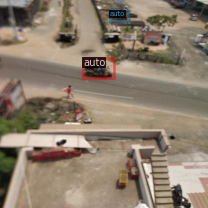

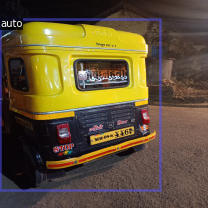

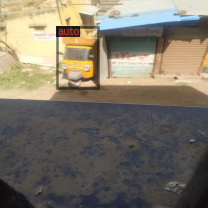

In [5]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train_4")
dataset_dicts = DatasetCatalog.get("my_dataset_train_4")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [6]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.
import os
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [7]:
# from detectron2.tools.train_net import Trainer
# from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train_4",)
cfg.DATASETS.TEST = ("my_dataset_val_4",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 450 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/30 07:50:13 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:07, 52.9MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_pre

[03/30 07:50:30 d2.engine.train_loop]: Starting training from iteration 0
[03/30 07:52:08 d2.utils.events]:  eta: 0:36:18  iter: 19  total_loss: 2.021  loss_cls: 1.098  loss_box_reg: 0.896  loss_rpn_cls: 0.018  loss_rpn_loc: 0.004  time: 4.9488  data_time: 0.0408  lr: 0.000020  max_mem: 7196M
[03/30 07:53:41 d2.utils.events]:  eta: 0:34:28  iter: 39  total_loss: 1.829  loss_cls: 0.929  loss_box_reg: 0.884  loss_rpn_cls: 0.021  loss_rpn_loc: 0.003  time: 4.7823  data_time: 0.0141  lr: 0.000040  max_mem: 7196M
[03/30 07:55:16 d2.utils.events]:  eta: 0:32:42  iter: 59  total_loss: 1.491  loss_cls: 0.654  loss_box_reg: 0.868  loss_rpn_cls: 0.011  loss_rpn_loc: 0.004  time: 4.7722  data_time: 0.0185  lr: 0.000060  max_mem: 7196M
[03/30 07:56:51 d2.utils.events]:  eta: 0:30:57  iter: 79  total_loss: 1.339  loss_cls: 0.456  loss_box_reg: 0.870  loss_rpn_cls: 0.015  loss_rpn_loc: 0.004  time: 4.7747  data_time: 0.0176  lr: 0.000080  max_mem: 7196M
[03/30 07:58:28 d2.utils.events]:  eta: 0:29:2

In [8]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [9]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test_4", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test_4")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [03/30 08:26:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/30 08:26:57 d2.data.datasets.coco]: Loaded 15 images in COCO format from ./drive/MyDrive/dataset_main/rcnn/test/_annotations.coco.json
[03/30 08:26:57 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|   autos    | 0            |    auto    | 19           |
|            |              |            |              |
|   total    | 19           |            |              |
[03/30 08:26:57 d2.data.common]: Serializing 15 elements to byte tensors and concatenating them all ...
[03/30 08:26:57 d2.data.common]: Serialized dataset takes 0.00 MiB
[03/30 08:26:57 d2.evaluation.evaluator]: Start inference on 15 images
[03/30 08:27:04 d2.evaluation.evaluator]: Inference done 11/15. 0.5486 s / img. ETA=0:00:02
[03/30 08:27:06 d

OrderedDict([('bbox',
              {'AP': 66.60312307103494,
               'AP-auto': 66.60312307103494,
               'AP-autos': nan,
               'AP50': 80.73027487519188,
               'AP75': 78.93967028281776,
               'APl': 81.78442844284429,
               'APm': 54.890381895332396,
               'APs': 16.666666666666664})])

In [10]:
%ls ./output/

coco_instances_results.json                       last_checkpoint
events.out.tfevents.1648626621.155ec6172ba3.71.0  metrics.json
instances_predictions.pth                         model_final.pth


In [11]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test_4", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test_4")

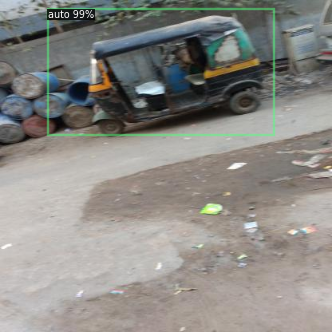

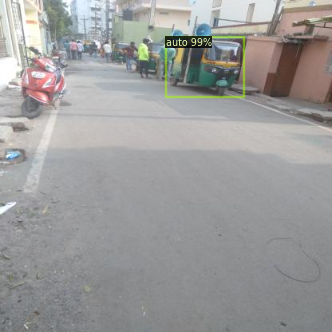

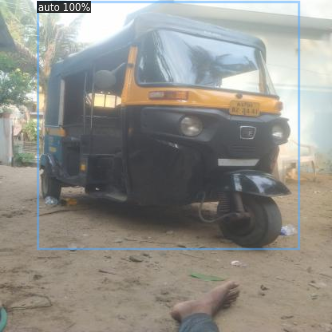

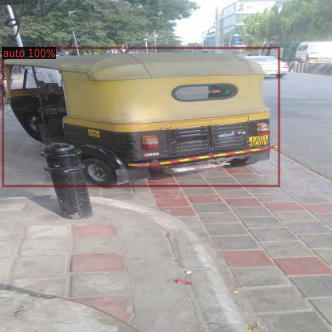

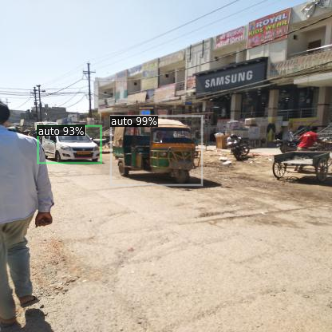

...

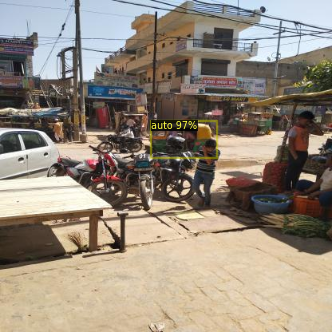

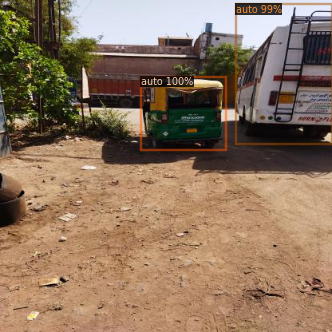

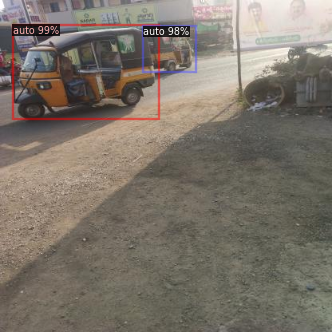

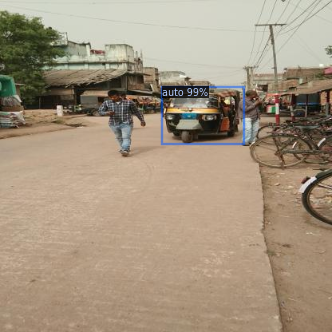

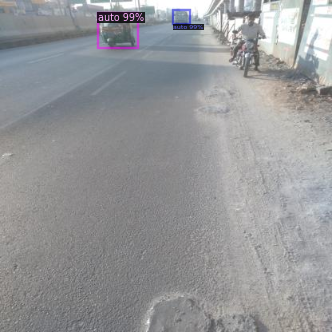

In [12]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('./drive/MyDrive/dataset_main/rcnn/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
